In [1]:
import os
path = '/home/lishenghe/SINTER3D/' 
os.chdir(path)  
import torch
import pandas as pd
import scanpy as sc
from sklearn import metrics
import multiprocessing as mp
import numpy as np
import anndata as ad 
from SINTER3D import utils
import warnings 
import scipy.io
warnings.filterwarnings("ignore")  

os.environ["CUDA_VISIBLE_DEVICES"] = "1"


In [ ]:
# import sc
mat = scipy.io.mmread("./data/spatialLIBD/scRNA/GSE144136_GeneBarcodeMatrix_Annotated.mtx")
meta = pd.read_csv("./data/spatialLIBD/scRNA/GSE144136_CellNames.csv", index_col=0)
meta.index = meta.x.values
group = [i.split('.')[1].split('_')[0] for i in list(meta.x.values)]
condition = [i.split('.')[1].split('_')[1] for i in list(meta.x.values)]
celltype = [i.split('.')[0] for i in list(meta.x.values)]
meta["group"] = group
meta["condition"] = condition
meta["celltype"] = celltype
genename = pd.read_csv("./data/spatialLIBD/scRNA/GSE144136_GeneNames.csv", index_col=0)
genename.index = genename.x.values
adata_ref = ad.AnnData(X=mat.tocsr().T)
adata_ref.obs = meta
adata_ref.var = genename
adata_ref = adata_ref[adata_ref.obs.condition.values.astype(str)=="Control", :]

In [2]:
# 加载ST数据 
adata1 = sc.read_h5ad('data/DLPFC/DLPFC_151673.h5ad') 
adata2 = sc.read_h5ad('data/DLPFC/DLPFC_151674.h5ad') 
adata3 = sc.read_h5ad('data/DLPFC/DLPFC_151675.h5ad') 
adata4 = sc.read_h5ad('data/DLPFC/DLPFC_151676.h5ad')  

adata1 = adata1[adata1.obs["cluster"] != "nan"].copy()
adata2 = adata2[adata2.obs["cluster"] != "nan"].copy()
adata3 = adata3[adata3.obs["cluster"] != "nan"].copy()
adata4 = adata4[adata4.obs["cluster"] != "nan"].copy()

adata_st_list = [adata1, adata2, adata3, adata4] 

slice_idx = [151673, 151674, 151675, 151676] 

In [ ]:
adata_st_list_raw = [adata1, adata2, adata3, adata4]

adata_st_list = utils.align_spots(adata_st_list_raw, plot=True)

In [ ]:
celltype_list_use = ['Astros_1', 'Astros_2', 'Astros_3', 
                     'Endo', 'Micro/Macro',
                     'Oligos_1', 'Oligos_2', 'Oligos_3',
                     'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 
                     'Ex_4_L_6', 'Ex_5_L5',
                     'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 
                     'Ex_9_L5_6', 'Ex_10_L2_4']


adata_st, adata_basis = utils.preprocess(adata_st_list,
                                                  adata_ref,
                                                  celltype_ref=celltype_list_use,
                                                  sample_col='group',
                                                  slice_dist_micron=[10., 300., 10.],
                                                  n_hvg_group=500)

In [3]:
from SINTER3D.predict_selector import auto_select_and_train 
model = auto_select_and_train(
    adata_st_list,
    adata_st,
    adata_basis,
    slice_idx=slice_idx,
    selector_path='/home/lishenghe/SINTER3D/model_selector.pkl',
    config='/home/lishenghe/SINTER3D/SINTER3D/config/DLPFC_73-76.json',
)


[特征] n_slices=4, expr_complexity=0.262790
🎯 数据驱动选择模型: BASIC
📄 Config parameters loaded: {'hidden_dims': [512, 128], 'slice_emb_dim': 16, 'training_steps': 7000, 'lr': 0.0001, 'seed': 2022, 'patience': 200, 'mid_channel': 200, 'save_path': './results_DLPFC', 'use_type': 'train', 'normalize': 100, 'alpha_poisson': 5, 'lambda_feature': 4, 'gamma_feature': 3}

✅ Final parameters in Model:
  hidden_dims: [512, 128]
  slice_emb_dim: 16
  training_steps: 7000
  lr: 0.0001
  seed: 2022
  patience: 200
  mid_channel: 200
  save_path: ./results_DLPFC
  use_type: train
  normalize: 100
  alpha_poisson: 5
  lambda_feature: 4
  gamma_feature: 3

随机种子已设置为: 2022


  0%|          | 2/7000 [00:00<10:16, 11.35it/s]

[Step 0] Loss=57190.546875 | Best=inf


 14%|█▍        | 1002/7000 [01:19<08:01, 12.46it/s]

[Step 1000] Loss=35567.640625 | Best=35569.226562


 29%|██▊       | 2002/7000 [02:39<06:37, 12.59it/s]

[Step 2000] Loss=34652.625000 | Best=34653.269531


 43%|████▎     | 3002/7000 [03:58<05:10, 12.87it/s]

[Step 3000] Loss=34064.187500 | Best=34064.679688


 57%|█████▋    | 4002/7000 [05:18<03:58, 12.55it/s]

[Step 4000] Loss=33642.546875 | Best=33642.777344


 71%|███████▏  | 5002/7000 [06:21<02:39, 12.55it/s]

[Step 5000] Loss=33309.570312 | Best=33309.847656


 86%|████████▌ | 6003/7000 [07:36<00:51, 19.48it/s]

[Step 6000] Loss=33028.210938 | Best=33028.472656


100%|██████████| 7000/7000 [08:53<00:00, 13.13it/s]

✅ Loaded best model state from training.


R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%
Slice 0 ARI: 0.6241 NMI: 0.7354


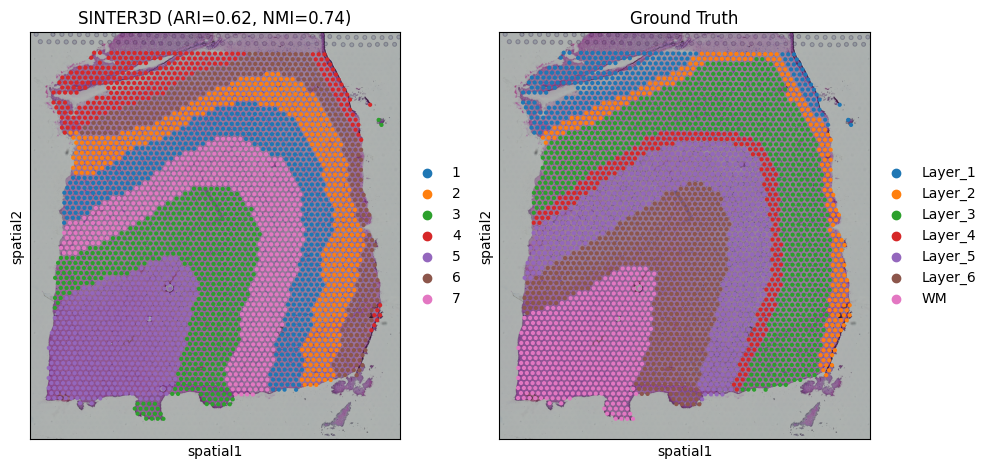

Slice 1 ARI: 0.6981 NMI: 0.7798


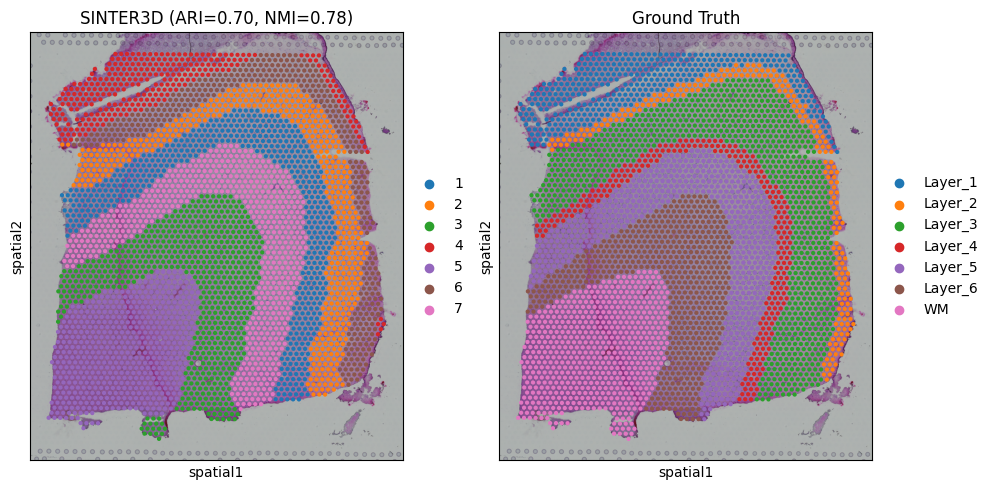

Slice 2 ARI: 0.6808 NMI: 0.7581


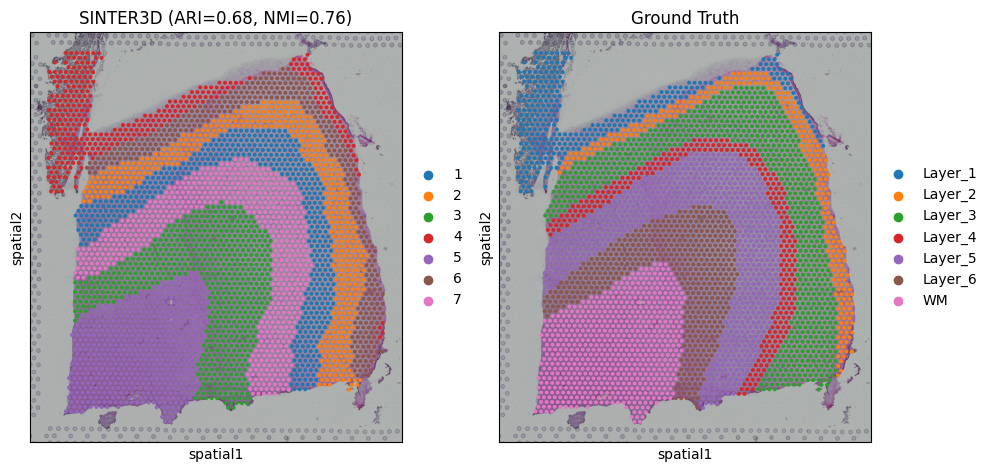

Slice 3 ARI: 0.6509 NMI: 0.7434


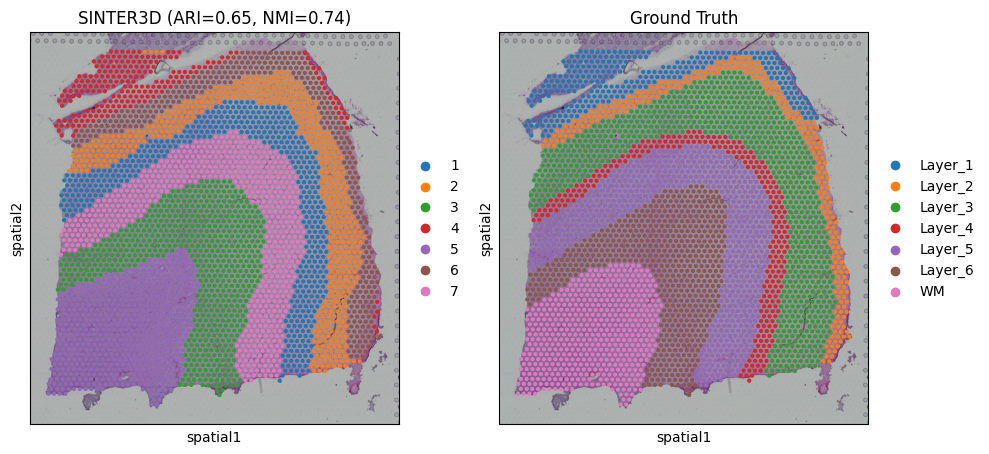

In [4]:
from sklearn.metrics import adjusted_rand_score,normalized_mutual_info_score
import matplotlib.pyplot as plt
import scanpy as sc

from SINTER3D.cluster import clustering
from SINTER3D.utils import set_seed

save_path = "./home/lishenghe/SINTER3D/result_DLPFC/"
result = model.eval(adata_st_list, save=True, output_path=save_path)

# 聚类
clustering(model.adata_st, n_clusters=7, radius=50, key='latent', method='mclust', refinement=False)

for i in range(len(result)):
    # 添加 domain 标签
    result[i].obs["domain"] = model.adata_st.obs.loc[result[i].obs_names, "domain"]

    # 计算 ARI
    ARI = adjusted_rand_score(result[i].obs["cluster"], result[i].obs["domain"])
    NMI = normalized_mutual_info_score(result[i].obs['cluster'], result[i].obs['domain'])
    print(f"Slice {i} ARI: {ARI:.4f} NMI: {NMI:.4f}")

    # 画一行两列
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    sc.pl.spatial(
        result[i],
        color=["domain"],
        title=["SINTER3D (ARI=%.2f, NMI=%.2f)" % (ARI, NMI)],
        spot_size=100,
        show=False,
        ax=axes[0]
    )

    sc.pl.spatial(
        result[i],
        color=["cluster"],
        title=["Ground Truth"],
        spot_size=100,
        show=False,
        ax=axes[1]
    )

    plt.tight_layout()
    plt.show()

Slice 151673 cell-type deconvolution result:
['Astros_1', 'Astros_2', 'Astros_3', 'Endo', 'Ex_10_L2_4', 'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 'Ex_4_L_6', 'Ex_5_L5', 'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 'Ex_9_L5_6', 'Micro/Macro', 'Oligos_1', 'Oligos_2', 'Oligos_3']


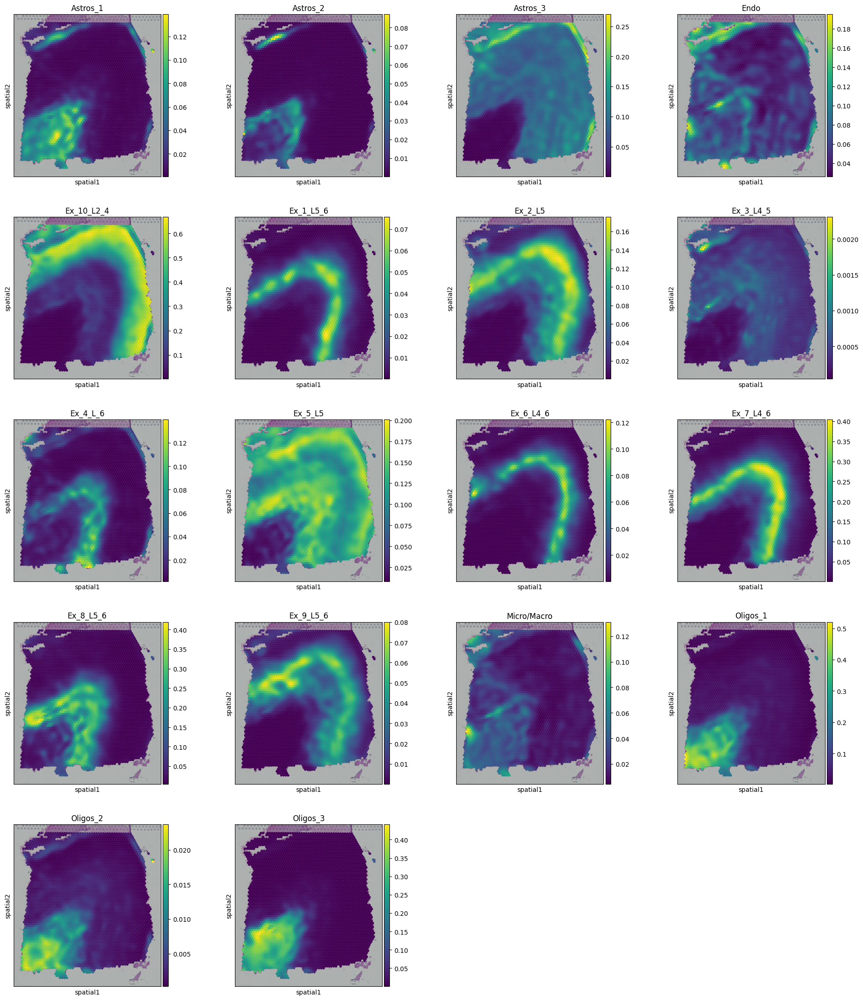

Slice 151674 cell-type deconvolution result:
['Astros_1', 'Astros_2', 'Astros_3', 'Endo', 'Ex_10_L2_4', 'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 'Ex_4_L_6', 'Ex_5_L5', 'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 'Ex_9_L5_6', 'Micro/Macro', 'Oligos_1', 'Oligos_2', 'Oligos_3']


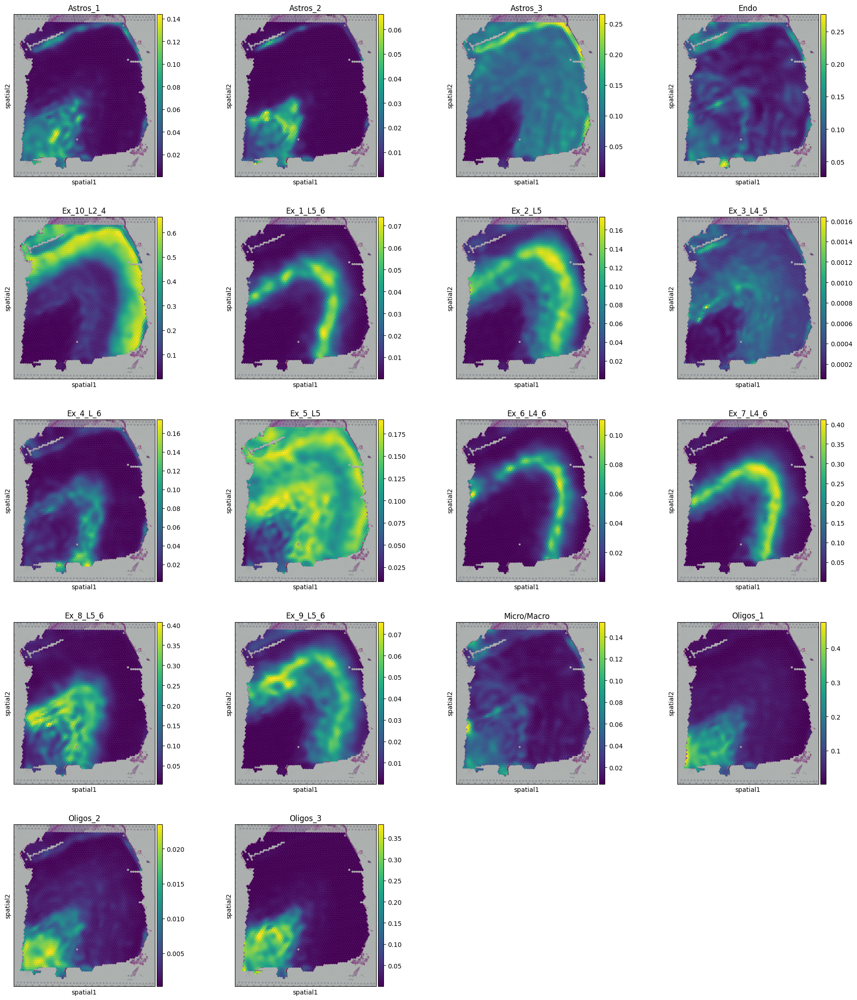

Slice 151675 cell-type deconvolution result:
['Astros_1', 'Astros_2', 'Astros_3', 'Endo', 'Ex_10_L2_4', 'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 'Ex_4_L_6', 'Ex_5_L5', 'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 'Ex_9_L5_6', 'Micro/Macro', 'Oligos_1', 'Oligos_2', 'Oligos_3']


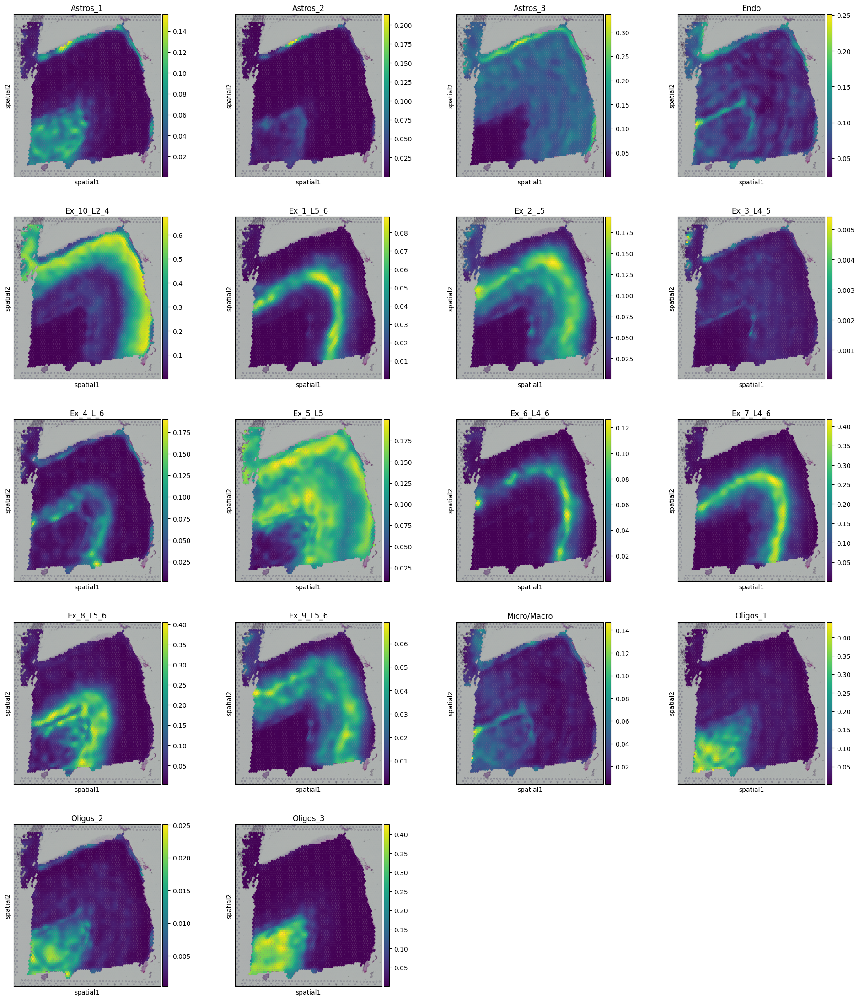

Slice 151676 cell-type deconvolution result:
['Astros_1', 'Astros_2', 'Astros_3', 'Endo', 'Ex_10_L2_4', 'Ex_1_L5_6', 'Ex_2_L5', 'Ex_3_L4_5', 'Ex_4_L_6', 'Ex_5_L5', 'Ex_6_L4_6', 'Ex_7_L4_6', 'Ex_8_L5_6', 'Ex_9_L5_6', 'Micro/Macro', 'Oligos_1', 'Oligos_2', 'Oligos_3']


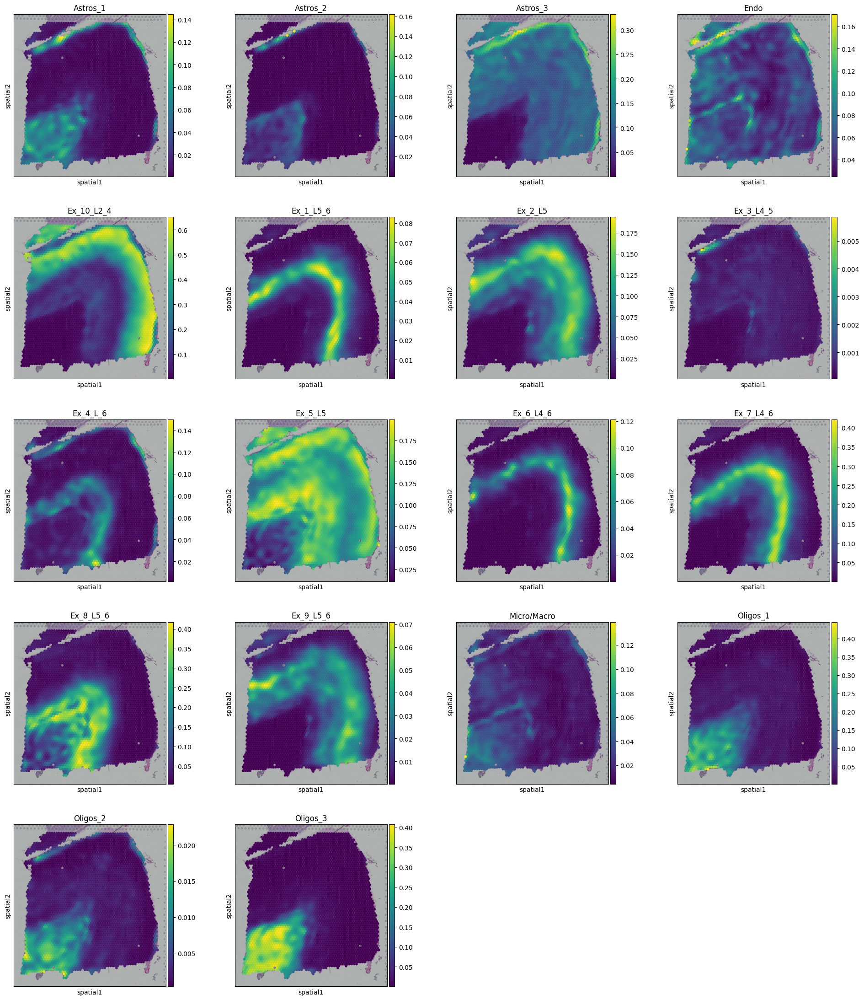

In [11]:

for i, adata_st_i in enumerate(result):
    print("Slice %d cell-type deconvolution result:" % slice_idx[i])
    
    print(list(adata_basis.obs.index))
    sc.pl.spatial(adata_st_i, img_key="lowres", spot_size=150,
                  color=list(adata_basis.obs.index), size=1.)



In [23]:
# 保存坐标
import pandas as pd

coords = adata_st.obsm["3D_coor"]
coords_df = pd.DataFrame(
    coords,
    index=adata_st.obs.index,        # 行索引：每个 spot 的 ID
    columns=["x", "y", "z"]       # 列名：坐标
)

coords_df.to_csv("/home/lishenghe/SINTER3D/result_DLPFC/3D_coordinates.csv")


In [27]:
#保存空间域
import pandas as pd

domain_series = adata_st.obs["cluster"]
domain_df = domain_series.to_frame()

domain_df.to_csv("/home/lishenghe/SINTER3D/result_DLPFC/ground_truth.csv")


In [17]:

a1 = result[0]
a2 = result[1]
a3 = result[2]
a4 = result[3]

🔍 开始智能数据格式检测...

🚀 开始执行ROC分析...
✅ Ex_10_L2_4      | AUC: 0.959 | 目标层: ['Layer2', 'Layer3', 'Layer4'] | 正样本: 1460
✅ Ex_1_L5_6       | AUC: 0.798 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1365
✅ Ex_2_L5         | AUC: 0.724 | 目标层: ['Layer5'] | 正样本:  673
✅ Ex_3_L4_5       | AUC: 0.771 | 目标层: ['Layer4', 'Layer5'] | 正样本:  891
✅ Ex_5_L5         | AUC: 0.588 | 目标层: ['Layer5'] | 正样本:  673
✅ Ex_6_L4_6       | AUC: 0.635 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1583
✅ Ex_7_L4_6       | AUC: 0.905 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1583
✅ Ex_8_L5_6       | AUC: 0.928 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1365
✅ Ex_9_L5_6       | AUC: 0.589 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1365

📈 分析完成!
   成功分析的细胞类型: 9
   平均AUC: 0.766
   AUC范围: 0.588 - 0.959
   最佳表现: Ex_10_L2_4 (AUC: 0.959)
   最差表现: Ex_5_L5 (AUC: 0.588)


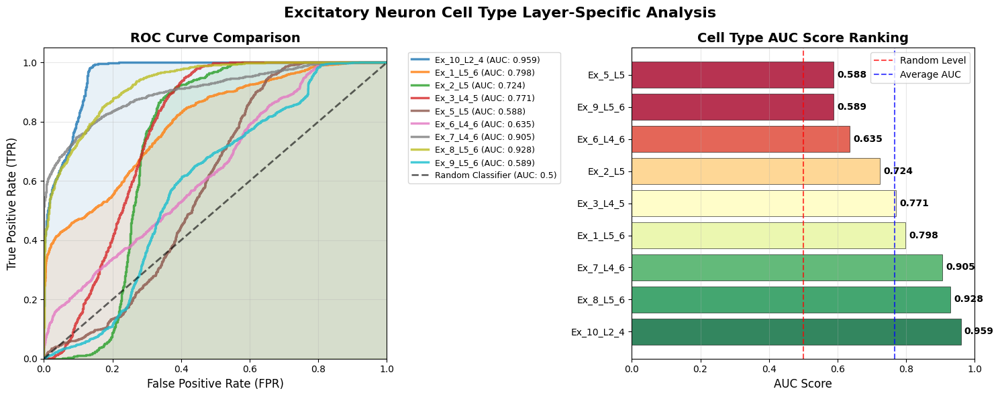

In [18]:
from SINTER3D.ROC_DLPFC import smart_roc_analysis,plot_roc_curves

auc_results, roc_curves = smart_roc_analysis(a1)

plot_roc_curves(auc_results, roc_curves)

🔍 开始智能数据格式检测...

🚀 开始执行ROC分析...
✅ Ex_10_L2_4      | AUC: 0.926 | 目标层: ['Layer2', 'Layer3', 'Layer4'] | 正样本: 1395
✅ Ex_1_L5_6       | AUC: 0.832 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1235
✅ Ex_2_L5         | AUC: 0.730 | 目标层: ['Layer5'] | 正样本:  621
✅ Ex_3_L4_5       | AUC: 0.783 | 目标层: ['Layer4', 'Layer5'] | 正样本:  868
✅ Ex_5_L5         | AUC: 0.585 | 目标层: ['Layer5'] | 正样本:  621
✅ Ex_6_L4_6       | AUC: 0.676 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1482
✅ Ex_7_L4_6       | AUC: 0.939 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1482
✅ Ex_8_L5_6       | AUC: 0.866 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1235
✅ Ex_9_L5_6       | AUC: 0.623 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1235

📈 分析完成!
   成功分析的细胞类型: 9
   平均AUC: 0.773
   AUC范围: 0.585 - 0.939
   最佳表现: Ex_7_L4_6 (AUC: 0.939)
   最差表现: Ex_5_L5 (AUC: 0.585)


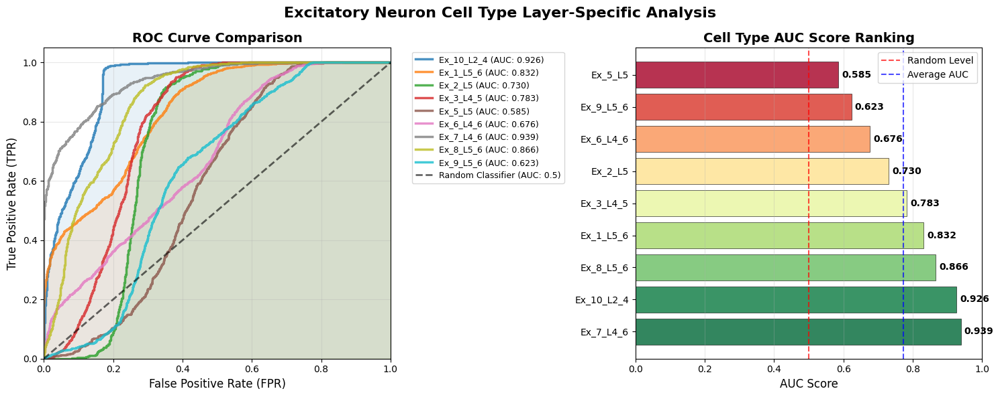

In [19]:
from SINTER3D.ROC_DLPFC import smart_roc_analysis,plot_roc_curves

auc_results, roc_curves = smart_roc_analysis(a2)

plot_roc_curves(auc_results, roc_curves)

🔍 开始智能数据格式检测...

🚀 开始执行ROC分析...
✅ Ex_10_L2_4      | AUC: 0.947 | 目标层: ['Layer2', 'Layer3', 'Layer4'] | 正样本: 1321
✅ Ex_1_L5_6       | AUC: 0.871 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265
✅ Ex_2_L5         | AUC: 0.768 | 目标层: ['Layer5'] | 正样本:  732
✅ Ex_3_L4_5       | AUC: 0.702 | 目标层: ['Layer4', 'Layer5'] | 正样本: 1007
✅ Ex_5_L5         | AUC: 0.551 | 目标层: ['Layer5'] | 正样本:  732
✅ Ex_6_L4_6       | AUC: 0.759 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1540
✅ Ex_7_L4_6       | AUC: 0.972 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1540
✅ Ex_8_L5_6       | AUC: 0.844 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265
✅ Ex_9_L5_6       | AUC: 0.702 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265

📈 分析完成!
   成功分析的细胞类型: 9
   平均AUC: 0.791
   AUC范围: 0.551 - 0.972
   最佳表现: Ex_7_L4_6 (AUC: 0.972)
   最差表现: Ex_5_L5 (AUC: 0.551)


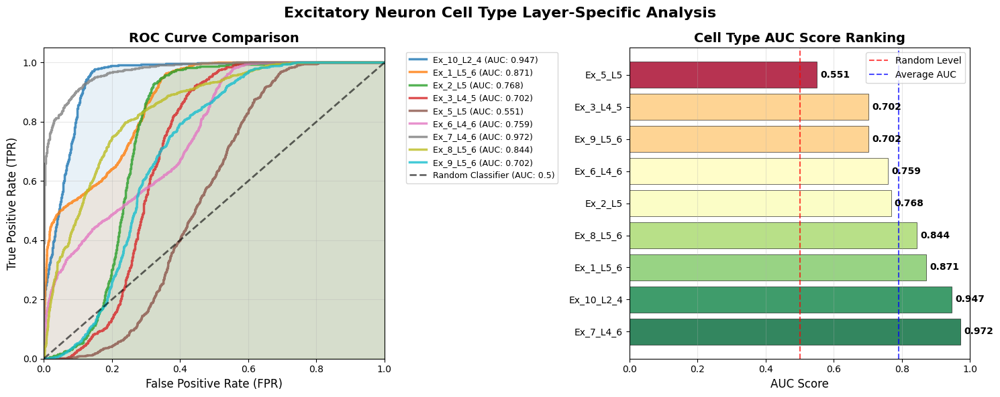

In [20]:
from SINTER3D.ROC_DLPFC import smart_roc_analysis,plot_roc_curves

auc_results, roc_curves = smart_roc_analysis(a3)

plot_roc_curves(auc_results, roc_curves)

🔍 开始智能数据格式检测...

🚀 开始执行ROC分析...
✅ Ex_10_L2_4      | AUC: 0.936 | 目标层: ['Layer2', 'Layer3', 'Layer4'] | 正样本: 1344
✅ Ex_1_L5_6       | AUC: 0.775 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265
✅ Ex_2_L5         | AUC: 0.705 | 目标层: ['Layer5'] | 正样本:  649
✅ Ex_3_L4_5       | AUC: 0.731 | 目标层: ['Layer4', 'Layer5'] | 正样本:  903
✅ Ex_5_L5         | AUC: 0.604 | 目标层: ['Layer5'] | 正样本:  649
✅ Ex_6_L4_6       | AUC: 0.676 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1519
✅ Ex_7_L4_6       | AUC: 0.927 | 目标层: ['Layer4', 'Layer5', 'Layer6'] | 正样本: 1519
✅ Ex_8_L5_6       | AUC: 0.884 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265
✅ Ex_9_L5_6       | AUC: 0.591 | 目标层: ['Layer5', 'Layer6'] | 正样本: 1265

📈 分析完成!
   成功分析的细胞类型: 9
   平均AUC: 0.759
   AUC范围: 0.591 - 0.936
   最佳表现: Ex_10_L2_4 (AUC: 0.936)
   最差表现: Ex_9_L5_6 (AUC: 0.591)


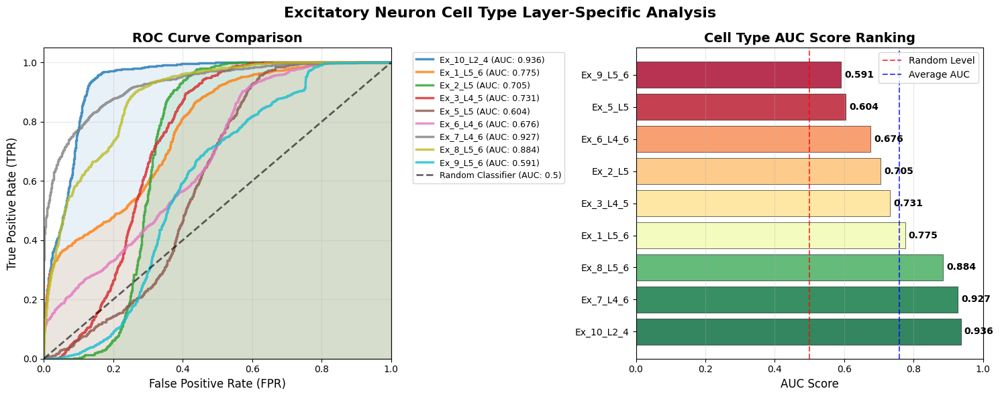

In [21]:
from SINTER3D.ROC_DLPFC import smart_roc_analysis,plot_roc_curves

auc_results, roc_curves = smart_roc_analysis(a4)

plot_roc_curves(auc_results, roc_curves)